In [33]:
import numpy as np
import requests
from bs4 import BeautifulSoup
import urllib
from PIL import Image
import re
import time
import string
import matplotlib.pyplot as plt
import pandas as pd
import pickle
from wordcloud import WordCloud, STOPWORDS
import networkx as nx
%matplotlib inline
from imdb_helper_functions import filtering, movie_link_soup, actor_link_soup
from imdb_code import get_actors_by_movie_soup, get_movies_by_actor_soup, get_movie_descriptions_by_actor_soup

# Network graphs

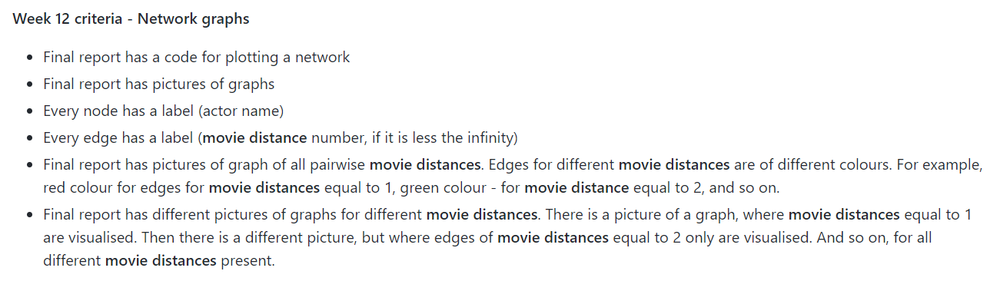

Below the function get_movie_distance from imdb_code.py is implemented, with added ability to save the obtained result to a dictionary to make the function run faster.

In [7]:
# If the file already exists:

# with open('movies_seen.pkl', 'rb') as f:
#     movies_seen = pickle.load(f)
    
# with open('actors_seen.pkl', 'rb') as f:
#     actors_seen = pickle.load(f)

In [42]:
# If no pickle files saved before:

movies_seen = dict()
actors_seen = dict()

In [43]:
def get_movie_distance(actor_start_url, actor_end_url, num_of_actors_limit=None, num_of_movies_limit=None):
    
    if 'www' not in actor_start_url:
        base_url = "https://www.imdb.com/name/nm"
        
        actor_url = actor_start_url.split('nm')[1]
        actor_start_url = base_url + actor_url        
    
    if 'www' not in actor_end_url:
        base_url = "https://www.imdb.com/name/nm"      
        
        actor_url = actor_end_url.split('nm')[1]
        actor_end_url = base_url + actor_url
        
        
    actors_list = set()
    
    distance = 1
    
    movies_list = set(get_movies_by_actor_soup(actor_link_soup(actor_start_url), num_of_movies_limit=num_of_movies_limit))
    movies_seen.update({actor_start_url : set(movies_list)})
    
    for movie in movies_list:
        time.sleep(1)
        get_actors_by_movie = get_actors_by_movie_soup(movie_link_soup(movie[1]), num_of_actors_limit=num_of_actors_limit)
        actors_list.update(get_actors_by_movie)
        actors_seen.update({movie[1] : set(get_actors_by_movie)})
    
    if any(actor_end_url in actor for actor in actors_list):
        return distance
    
    distance = 2
        
    while distance < 4:

        movies_list.clear()
        for actor in actors_list:
            if actor[1] in movies_seen.keys():
                movies_list.update(movies_seen[actor[1]])
            else:
                time.sleep(1)
                get_movies_by_actor = get_movies_by_actor_soup(actor_link_soup(actor[1]), num_of_movies_limit=num_of_movies_limit)
                movies_list.update(get_movies_by_actor)
                movies_seen.update({actor[1] : set(get_movies_by_actor)})

        actors_list.clear()
        for movie in movies_list:
            if movie[1] in actors_seen.keys():
                actors_list.update(actors_seen[movie[1]])
            else:
                time.sleep(1)
                get_actors_by_movie = get_actors_by_movie_soup(movie_link_soup(movie[1]), num_of_actors_limit=num_of_actors_limit)
                actors_list.update(get_actors_by_movie)
                actors_seen.update({movie[1] : set(get_actors_by_movie)})

        if any(actor_end_url in actor for actor in actors_list):
            return distance
        else:
            distance += 1
                
    return np.inf

In this step we obtain all pairwise move distances for highest-paid actors of 2019. They are

1. Dwayne Johnson
2. Chris Hemsworth
3. Robert Downey Jr.
4. Akshay Kumar
5. Jackie Chan
6. Bradley Cooper
7. Adam Sandler
8. Scarlett Johansson
9. Sofia Vergara
10. Chris Evans

In [44]:
DwayneJohnson_url = 'https://www.imdb.com/name/nm0425005/'
ChrisHemsworth_url = 'https://www.imdb.com/name/nm1165110/'
RobertDowneyJr_url = 'https://www.imdb.com/name/nm0000375/'
AkshayKumar_url = 'https://www.imdb.com/name/nm0474774/'
JackieChan_url = 'https://www.imdb.com/name/nm0000329/'
BradleyCooper_url = 'https://www.imdb.com/name/nm0177896/'
AdamSandler_url = 'https://www.imdb.com/name/nm0001191/'
ScarlettJohansson_url = 'https://www.imdb.com/name/nm0424060/'
SofiaVergara_url = 'https://www.imdb.com/name/nm0005527/'
ChrisEvans_url = 'https://www.imdb.com/name/nm0262635/'

In [45]:
DwayneJohnson_ChrisHemsworth = get_movie_distance(DwayneJohnson_url, ChrisHemsworth_url, num_of_actors_limit=5, num_of_movies_limit=5)
DwayneJohnson_ChrisHemsworth

2

In [46]:
DwayneJohnson_RobertDowneyJr = get_movie_distance(DwayneJohnson_url, RobertDowneyJr_url, num_of_actors_limit=5, num_of_movies_limit=5)
DwayneJohnson_RobertDowneyJr

3

In [53]:
DwayneJohnson_AkshayKumar = get_movie_distance(DwayneJohnson_url, AkshayKumar_url, num_of_actors_limit=5, num_of_movies_limit=5)
DwayneJohnson_AkshayKumar

inf

In [54]:
DwayneJohnson_JackieChan = get_movie_distance(DwayneJohnson_url, JackieChan_url, num_of_actors_limit=5, num_of_movies_limit=5)
DwayneJohnson_JackieChan

inf

In [55]:
DwayneJohnson_BradleyCooper = get_movie_distance(DwayneJohnson_url, BradleyCooper_url, num_of_actors_limit=5, num_of_movies_limit=5)
DwayneJohnson_BradleyCooper

3

In [56]:
DwayneJohnson_AdamSandler = get_movie_distance(DwayneJohnson_url, AdamSandler_url, num_of_actors_limit=5, num_of_movies_limit=5)
DwayneJohnson_AdamSandler

3

In [57]:
DwayneJohnson_ScarlettJohansson = get_movie_distance(DwayneJohnson_url, ScarlettJohansson_url, num_of_actors_limit=5, num_of_movies_limit=5)
DwayneJohnson_ScarlettJohansson

3

In [58]:
DwayneJohnson_SofiaVergara = get_movie_distance(DwayneJohnson_url, SofiaVergara_url, num_of_actors_limit=5, num_of_movies_limit=5)
DwayneJohnson_SofiaVergara

inf

In [59]:
DwayneJohnson_ChrisEvans = get_movie_distance(DwayneJohnson_url, ChrisEvans_url, num_of_actors_limit=5, num_of_movies_limit=5)
DwayneJohnson_ChrisEvans

3

In [68]:
RobertDowneyJr_ChrisHemsworth = get_movie_distance(RobertDowneyJr_url, ChrisHemsworth_url, num_of_actors_limit=5, num_of_movies_limit=5)
RobertDowneyJr_ChrisHemsworth

1

In [9]:
ChrisHemsworth_AkshayKumar = get_movie_distance(ChrisHemsworth_url, AkshayKumar_url, num_of_actors_limit=5, num_of_movies_limit=5)
ChrisHemsworth_AkshayKumar

3

In [70]:
ChrisHemsworth_JackieChan = get_movie_distance(ChrisHemsworth_url, JackieChan_url, num_of_actors_limit=5, num_of_movies_limit=5)
ChrisHemsworth_JackieChan

2

In [71]:
ChrisHemsworth_BradleyCooper = get_movie_distance(ChrisHemsworth_url, BradleyCooper_url, num_of_actors_limit=5, num_of_movies_limit=5)
ChrisHemsworth_BradleyCooper

3

In [72]:
ChrisHemsworth_AdamSandler = get_movie_distance(ChrisHemsworth_url, AdamSandler_url, num_of_actors_limit=5, num_of_movies_limit=5)
ChrisHemsworth_AdamSandler

inf

In [13]:
ScarlettJohansson_ChrisHemsworth = get_movie_distance(ScarlettJohansson_url, ChrisHemsworth_url, num_of_actors_limit=5, num_of_movies_limit=5)
ScarlettJohansson_ChrisHemsworth

1

In [74]:
ChrisHemsworth_SofiaVergara = get_movie_distance(ChrisHemsworth_url, SofiaVergara_url, num_of_actors_limit=5, num_of_movies_limit=5)
ChrisHemsworth_SofiaVergara

3

In [75]:
ChrisHemsworth_ChrisEvans = get_movie_distance(ChrisHemsworth_url, ChrisEvans_url, num_of_actors_limit=5, num_of_movies_limit=5)
ChrisHemsworth_ChrisEvans

3

In [81]:
RobertDowneyJr_AkshayKumar = get_movie_distance(RobertDowneyJr_url, AkshayKumar_url, num_of_actors_limit=5, num_of_movies_limit=5)
RobertDowneyJr_AkshayKumar

inf

In [82]:
RobertDowneyJr_JackieChan = get_movie_distance(RobertDowneyJr_url, JackieChan_url, num_of_actors_limit=5, num_of_movies_limit=5)
RobertDowneyJr_JackieChan

3

In [83]:
RobertDowneyJr_BradleyCooper = get_movie_distance(RobertDowneyJr_url, BradleyCooper_url, num_of_actors_limit=5, num_of_movies_limit=5)
RobertDowneyJr_BradleyCooper

3

In [29]:
AdamSandler_RobertDowneyJr = get_movie_distance(AdamSandler_url, RobertDowneyJr_url, num_of_actors_limit=5, num_of_movies_limit=5)
AdamSandler_RobertDowneyJr

3

In [85]:
RobertDowneyJr_ScarlettJohansson = get_movie_distance(RobertDowneyJr_url, ScarlettJohansson_url, num_of_actors_limit=5, num_of_movies_limit=5)
RobertDowneyJr_ScarlettJohansson

1

In [86]:
RobertDowneyJr_SofiaVergara = get_movie_distance(RobertDowneyJr_url, SofiaVergara_url, num_of_actors_limit=5, num_of_movies_limit=5)
RobertDowneyJr_SofiaVergara

3

In [87]:
RobertDowneyJr_ChrisEvans = get_movie_distance(RobertDowneyJr_url, ChrisEvans_url, num_of_actors_limit=5, num_of_movies_limit=5)
RobertDowneyJr_ChrisEvans

1

In [88]:
AkshayKumar_JackieChan = get_movie_distance(AkshayKumar_url, JackieChan_url, num_of_actors_limit=5, num_of_movies_limit=5)
AkshayKumar_JackieChan

inf

In [91]:
AkshayKumar_BradleyCooper = get_movie_distance(AkshayKumar_url, BradleyCooper_url, num_of_actors_limit=5, num_of_movies_limit=5)
AkshayKumar_BradleyCooper

inf

In [92]:
AkshayKumar_AdamSandler = get_movie_distance(AkshayKumar_url, AdamSandler_url, num_of_actors_limit=5, num_of_movies_limit=5)
AkshayKumar_AdamSandler

3

In [93]:
AkshayKumar_ScarlettJohansson = get_movie_distance(AkshayKumar_url, ScarlettJohansson_url, num_of_actors_limit=5, num_of_movies_limit=5)
AkshayKumar_ScarlettJohansson

inf

In [94]:
AkshayKumar_SofiaVergara = get_movie_distance(AkshayKumar_url, SofiaVergara_url, num_of_actors_limit=5, num_of_movies_limit=5)
AkshayKumar_SofiaVergara

inf

In [95]:
AkshayKumar_ChrisEvans = get_movie_distance(AkshayKumar_url, ChrisEvans_url, num_of_actors_limit=5, num_of_movies_limit=5)
AkshayKumar_ChrisEvans

2

In [96]:
JackieChan_BradleyCooper = get_movie_distance(JackieChan_url, BradleyCooper_url, num_of_actors_limit=5, num_of_movies_limit=5)
JackieChan_BradleyCooper

inf

In [97]:
JackieChan_AdamSandler = get_movie_distance(JackieChan_url, AdamSandler_url, num_of_actors_limit=5, num_of_movies_limit=5)
JackieChan_AdamSandler

inf

In [98]:
JackieChan_ScarlettJohansson = get_movie_distance(JackieChan_url, ScarlettJohansson_url, num_of_actors_limit=5, num_of_movies_limit=5)
JackieChan_ScarlettJohansson

inf

In [99]:
JackieChan_SofiaVergara = get_movie_distance(JackieChan_url, SofiaVergara_url, num_of_actors_limit=5, num_of_movies_limit=5)
JackieChan_SofiaVergara

inf

In [100]:
JackieChan_ChrisEvans = get_movie_distance(JackieChan_url, ChrisEvans_url, num_of_actors_limit=5, num_of_movies_limit=5)
JackieChan_ChrisEvans

3

In [102]:
BradleyCooper_AdamSandler = get_movie_distance(BradleyCooper_url, AdamSandler_url, num_of_actors_limit=5, num_of_movies_limit=5)
BradleyCooper_AdamSandler

3

In [103]:
BradleyCooper_ScarlettJohansson = get_movie_distance(BradleyCooper_url, ScarlettJohansson_url, num_of_actors_limit=5, num_of_movies_limit=5)
BradleyCooper_ScarlettJohansson

3

In [104]:
BradleyCooper_SofiaVergara = get_movie_distance(BradleyCooper_url, SofiaVergara_url, num_of_actors_limit=5, num_of_movies_limit=5)
BradleyCooper_SofiaVergara

3

In [115]:
BradleyCooper_ChrisEvans = get_movie_distance(BradleyCooper_url, ChrisEvans_url, num_of_actors_limit=5, num_of_movies_limit=5)
BradleyCooper_ChrisEvans

2

In [117]:
AdamSandler_ScarlettJohansson = get_movie_distance(AdamSandler_url, ScarlettJohansson_url, num_of_actors_limit=5, num_of_movies_limit=5)
AdamSandler_ScarlettJohansson

2

In [118]:
AdamSandler_SofiaVergara = get_movie_distance(AdamSandler_url, SofiaVergara_url, num_of_actors_limit=5, num_of_movies_limit=5)
AdamSandler_SofiaVergara

3

In [119]:
AdamSandler_ChrisEvans = get_movie_distance(AdamSandler_url, ChrisEvans_url, num_of_actors_limit=5, num_of_movies_limit=5)
AdamSandler_ChrisEvans

3

In [120]:
ScarlettJohansson_SofiaVergara = get_movie_distance(ScarlettJohansson_url, SofiaVergara_url, num_of_actors_limit=5, num_of_movies_limit=5)
ScarlettJohansson_SofiaVergara

inf

In [121]:
ScarlettJohansson_ChrisEvans = get_movie_distance(ScarlettJohansson_url, ChrisEvans_url, num_of_actors_limit=5, num_of_movies_limit=5)
ScarlettJohansson_ChrisEvans

1

In [122]:
SofiaVergara_ChrisEvans = get_movie_distance(SofiaVergara_url, ChrisEvans_url, num_of_actors_limit=5, num_of_movies_limit=5)
SofiaVergara_ChrisEvans

2

In [127]:
with open('actors_seen.pkl', 'wb') as f:
    pickle.dump(actors_seen, f)
with open('movies_seen.pkl', 'wb') as f:
    pickle.dump(movies_seen, f)

In [16]:
actors_distances = [
    ["Dwayne Johnson", "Chris Hemsworth", 2],
    ["Dwayne Johnson", "Robert Downey Jr.", 3],
    ["Dwayne Johnson", "Akshay Kumar", np.inf],
    ["Dwayne Johnson", "Jackie Chan", np.inf],
    ["Dwayne Johnson", "Bradley Cooper", 3],
    ["Dwayne Johnson", "Adam Sandler", 3],
    ["Dwayne Johnson", "Scarlett Johansson", 3],
    ["Dwayne Johnson", "Sofia Vergara", np.inf],
    ["Dwayne Johnson", "Chris Evans", 3],
    ["Robert Downey Jr.", "Chris Hemsworth", 1],
    ["Chris Hemsworth", "Akshay Kumar", 3],
    ["Chris Hemsworth", "Jackie Chan", 2],
    ["Chris Hemsworth", "Bradley Cooper", 3],
    ["Chris Hemsworth", "Adam Sandler", np.inf],
    ["Scarlett Johansson", "Chris Hemsworth", 1],
    ["Chris Hemsworth", "Sofia Vergara", 3],
    ["Chris Hemsworth", "Chris Evans", 3],
    ["Robert Downey Jr.", "Akshay Kumar", np.inf],
    ["Robert Downey Jr.", "Jackie Chan", 3],
    ["Robert Downey Jr.", "Bradley Cooper", 3],
    ["Adam Sandler", "Robert Downey Jr.", 3],
    ["Robert Downey Jr.", "Scarlett Johansson", 1],
    ["Robert Downey Jr.", "Sofia Vergara", 3],
    ["Robert Downey Jr.", "Chris Evans", 1],  
    ["Akshay Kumar", "Jackie Chan", np.inf],
    ["Akshay Kumar", "Bradley Cooper", np.inf],
    ["Akshay Kumar", "Adam Sandler", 3],
    ["Akshay Kumar", "Scarlett Johansson", np.inf],
    ["Akshay Kumar", "Sofia Vergara", np.inf],
    ["Akshay Kumar", "Chris Evans", 2],
    ["Jackie Chan", "Bradley Cooper", np.inf],
    ["Jackie Chan", "Adam Sandler", np.inf],
    ["Jackie Chan", "Scarlett Johansson", np.inf],
    ["Jackie Chan", "Sofia Vergara", np.inf],
    ["Jackie Chan", "Chris Evans", 3],
    ["Bradley Cooper", "Adam Sandler", 3],
    ["Bradley Cooper", "Scarlett Johansson", 3],
    ["Bradley Cooper", "Sofia Vergara", 3],
    ["Bradley Cooper", "Chris Evans", 2],
    ["Adam Sandler", "Scarlett Johansson", 2],
    ["Adam Sandler", "Sofia Vergara", 3],
    ["Adam Sandler", "Chris Evans", 3],
    ["Scarlett Johansson", "Sofia Vergara", np.inf],
    ["Scarlett Johansson", "Chris Evans", 1],
    ["Sofia Vergara", "Chris Evans", 2]
]

In [17]:
np.savetxt("pairwise_movie_distances.csv", 
           actors_distances,
           delimiter =", ", 
           fmt ='% s')

In [19]:
df = pd.read_csv("pairwise_movie_distances.csv", names=['start_actor', 'end_actor', 'distance'])
df.sort_values(by='distance', ignore_index=True)

,start_actor,end_actor,distance
0,Robert Downey Jr.,Chris Evans,1
1,Scarlett Johansson,Chris Evans,1
2,Robert Downey Jr.,Scarlett Johansson,1
3,Scarlett Johansson,Chris Hemsworth,1
4,Robert Downey Jr.,Chris Hemsworth,1
5,Dwayne Johnson,Chris Hemsworth,2
6,Adam Sandler,Scarlett Johansson,2
7,Bradley Cooper,Chris Evans,2
8,Akshay Kumar,Chris Evans,2
9,Chris Hemsworth,Jackie Chan,2


In [157]:
graph_nodes = [
    "Dwayne Johnson",
    "Chris Hemsworth",
    "Robert Downey Jr.",
    "Akshay Kumar",
    "Jackie Chan",
    "Bradley Cooper",
    "Adam Sandler",
    "Scarlett Johansson",
    "Sofia Vergara",
    "Chris Evans",
]

In [158]:
graph_edges = [
    ["Dwayne Johnson", "Chris Hemsworth", 2],
    ["Dwayne Johnson", "Robert Downey Jr.", 3],
    ["Dwayne Johnson", "Bradley Cooper", 3],
    ["Dwayne Johnson", "Adam Sandler", 3],
    ["Dwayne Johnson", "Scarlett Johansson", 3],
    ["Dwayne Johnson", "Chris Evans", 3],
    ["Robert Downey Jr.", "Chris Hemsworth", 1],
    ["Chris Hemsworth", "Akshay Kumar", 3],
    ["Chris Hemsworth", "Jackie Chan", 2],
    ["Chris Hemsworth", "Bradley Cooper", 3],
    ["Scarlett Johansson", "Chris Hemsworth", 1],
    ["Chris Hemsworth", "Sofia Vergara", 3],
    ["Chris Hemsworth", "Chris Evans", 3],
    ["Robert Downey Jr.", "Jackie Chan", 3],
    ["Robert Downey Jr.", "Bradley Cooper", 3],
    ["Adam Sandler", "Robert Downey Jr.", 3],
    ["Robert Downey Jr.", "Scarlett Johansson", 1],
    ["Robert Downey Jr.", "Sofia Vergara", 3],
    ["Robert Downey Jr.", "Chris Evans", 1],  
    ["Akshay Kumar", "Adam Sandler", 3],
    ["Akshay Kumar", "Chris Evans", 2],
    ["Jackie Chan", "Chris Evans", 3],
    ["Bradley Cooper", "Adam Sandler", 3],
    ["Bradley Cooper", "Scarlett Johansson", 3],
    ["Bradley Cooper", "Sofia Vergara", 3],
    ["Bradley Cooper", "Chris Evans", 2],
    ["Adam Sandler", "Scarlett Johansson", 2],
    ["Adam Sandler", "Sofia Vergara", 3],
    ["Adam Sandler", "Chris Evans", 3],
    ["Scarlett Johansson", "Chris Evans", 1],
    ["Sofia Vergara", "Chris Evans", 2]
]

## Graph of all pairwise movie distances

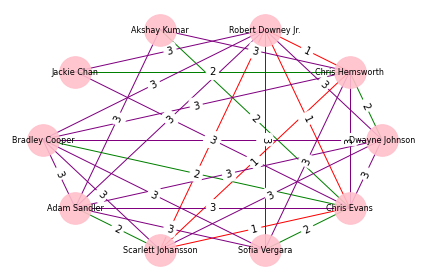

In [223]:
G=nx.Graph()

for i in graph_nodes:
    G.add_node(i)

G.add_weighted_edges_from(graph_edges, data=True)

distance_1 = [(n1, n2) for (n1, n2, d) in G.edges(data=True) if d['weight'] == 1]
distance_2 = [(n1, n2) for (n1, n2, d) in G.edges(data=True) if d['weight'] == 2]
distance_3 = [(n1, n2) for (n1, n2, d) in G.edges(data=True) if d['weight'] == 3]

pos = nx.circular_layout(G)

nx.draw_networkx_nodes(G, pos, node_size=1000, node_color='pink', alpha=0.9)

nx.draw_networkx_edges(G, pos, edgelist=distance_1, width=1, alpha=1, edge_color='r')
nx.draw_networkx_edges(G, pos, edgelist=distance_2, width=1, alpha=1, edge_color='g')
nx.draw_networkx_edges(G, pos, edgelist=distance_3, width=1, alpha=1, edge_color='purple')

edge_labels = nx.get_edge_attributes(G,'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
nx.draw_networkx_labels(G, pos, font_size=8)

plt.axis('off')
plt.tight_layout()

## Graphs for different movie distances: 1, 2 and 3

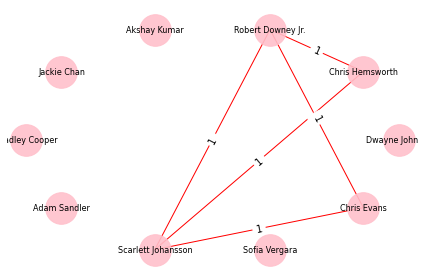

In [235]:
G=nx.Graph()

for i in graph_nodes:
    G.add_node(i)
    
edges_1 = [item for item in graph_edges if item[-1] == 1]

G.add_weighted_edges_from(edges_1, data=True)

distance_1 = [(n1, n2) for (n1, n2, d) in G.edges(data=True) if d['weight'] == 1]

pos = nx.circular_layout(G)

nx.draw_networkx_nodes(G, pos, node_size=1000, node_color='pink', alpha=0.9)

nx.draw_networkx_edges(G, pos, edgelist=distance_1, width=1, alpha=1, edge_color='r')

edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
nx.draw_networkx_labels(G, pos, font_size=8)

plt.axis('off')
plt.tight_layout()

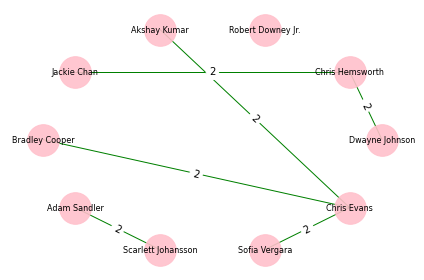

In [237]:
G=nx.Graph()

for i in graph_nodes:
    G.add_node(i)
    
edges_2 = [item for item in graph_edges if item[-1] == 2]

G.add_weighted_edges_from(edges_2, data=True)

distance_2 = [(n1, n2) for (n1, n2, d) in G.edges(data=True) if d['weight'] == 2]

pos = nx.circular_layout(G)

nx.draw_networkx_nodes(G, pos, node_size=1000, node_color='pink', alpha=0.9)

nx.draw_networkx_edges(G, pos, edgelist=distance_2, width=1, alpha=1, edge_color='g')

edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
nx.draw_networkx_labels(G, pos, font_size=8)

plt.axis('off')
plt.tight_layout()

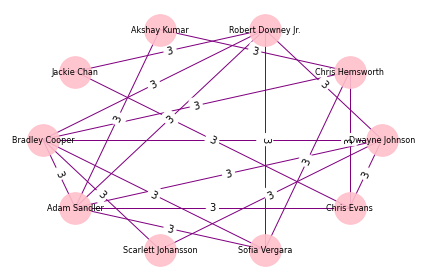

In [238]:
G=nx.Graph()

for i in graph_nodes:
    G.add_node(i)
    
edges_3 = [item for item in graph_edges if item[-1] == 3]

G.add_weighted_edges_from(edges_3, data=True)

distance_3 = [(n1, n2) for (n1, n2, d) in G.edges(data=True) if d['weight'] == 3]

pos = nx.circular_layout(G)

nx.draw_networkx_nodes(G, pos, node_size=1000, node_color='pink', alpha=0.9)

nx.draw_networkx_edges(G, pos, edgelist=distance_3, width=1, alpha=1, edge_color='purple')

edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
nx.draw_networkx_labels(G, pos, font_size=8)

plt.axis('off')
plt.tight_layout()

# Wordcloud

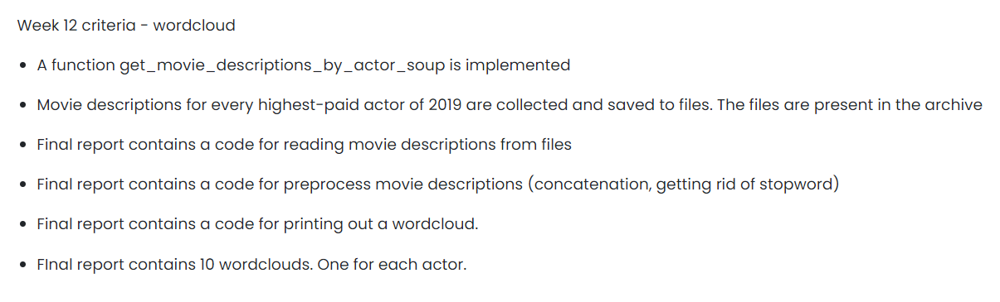

We should get movie descriptions for every highest-paid actor of 2019. They are:

1. Dwayne Johnson
2. Chris Hemsworth
3. Robert Downey Jr.
4. Akshay Kumar
5. Jackie Chan
6. Bradley Cooper
7. Adam Sandler
8. Scarlett Johansson
9. Sofia Vergara
10. Chris Evans

In [20]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(40, 30))
    plt.imshow(wordcloud) 
    plt.axis("off");

### Dwayne Johnson

In [ ]:
DwayneJohnson_url = 'https://www.imdb.com/name/nm0425005/'
DwayneJohnson_soup = actor_link_soup(DwayneJohnson_url)

DwayneJohnson_desc_list = get_movie_descriptions_by_actor_soup(DwayneJohnson_soup)

with open('1_DwayneJohnson_desc.txt', 'w', encoding="utf-8") as f:
    for line in DwayneJohnson_desc_list:
        f.write(f"{line}\n")

In [23]:
with open('1_DwayneJohnson_desc.txt', 'r') as file:
    DwayneJohnson_desc = file.read().replace('\n', '')

In [29]:
DwayneJohnson_desc_list_clean = DwayneJohnson_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [37]:
mask_link = 'https://i.dlpng.com/static/png/7560768_pre.jpg'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

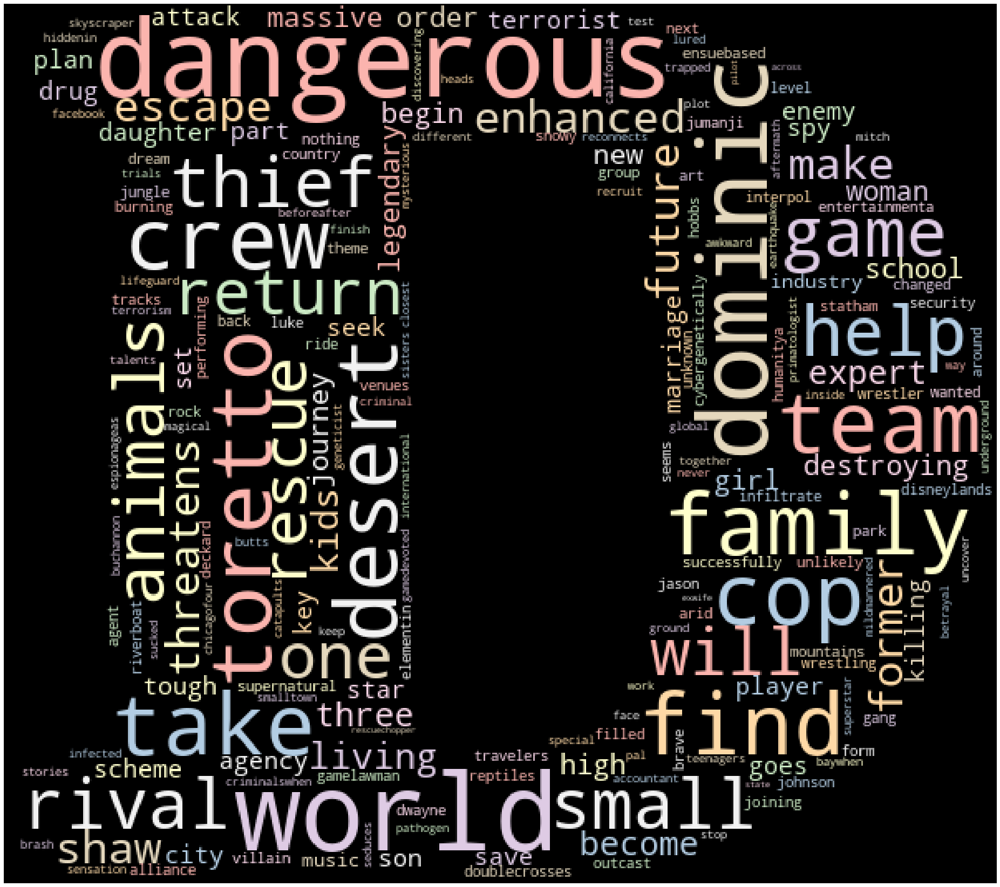

In [43]:
DwayneJohnson_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask = mask,
    collocations=False,
    stopwords=STOPWORDS.update(["series", "must", "video", "gets"]),
).generate(DwayneJohnson_desc_list_clean)

plot_cloud(DwayneJohnson_wordcloud)

### Chris Hemsworth

In [44]:
ChrisHemsworth_url = 'https://www.imdb.com/name/nm1165110/'
ChrisHemsworth_soup = actor_link_soup(ChrisHemsworth_url)

ChrisHemsworth_desc_list = get_movie_descriptions_by_actor_soup(ChrisHemsworth_soup)

with open('2_ChrisHemsworth_desc.txt', 'w', encoding="utf-8") as f:
    for line in ChrisHemsworth_desc_list:
        f.write(f"{line}\n")

In [46]:
with open('2_ChrisHemsworth_desc.txt', 'r') as file:
    ChrisHemsworth_desc = file.read().replace('\n', '')

In [48]:
ChrisHemsworth_desc_list_clean = ChrisHemsworth_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [49]:
mask_link = 'https://i.dlpng.com/static/png/7507147_preview.png'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

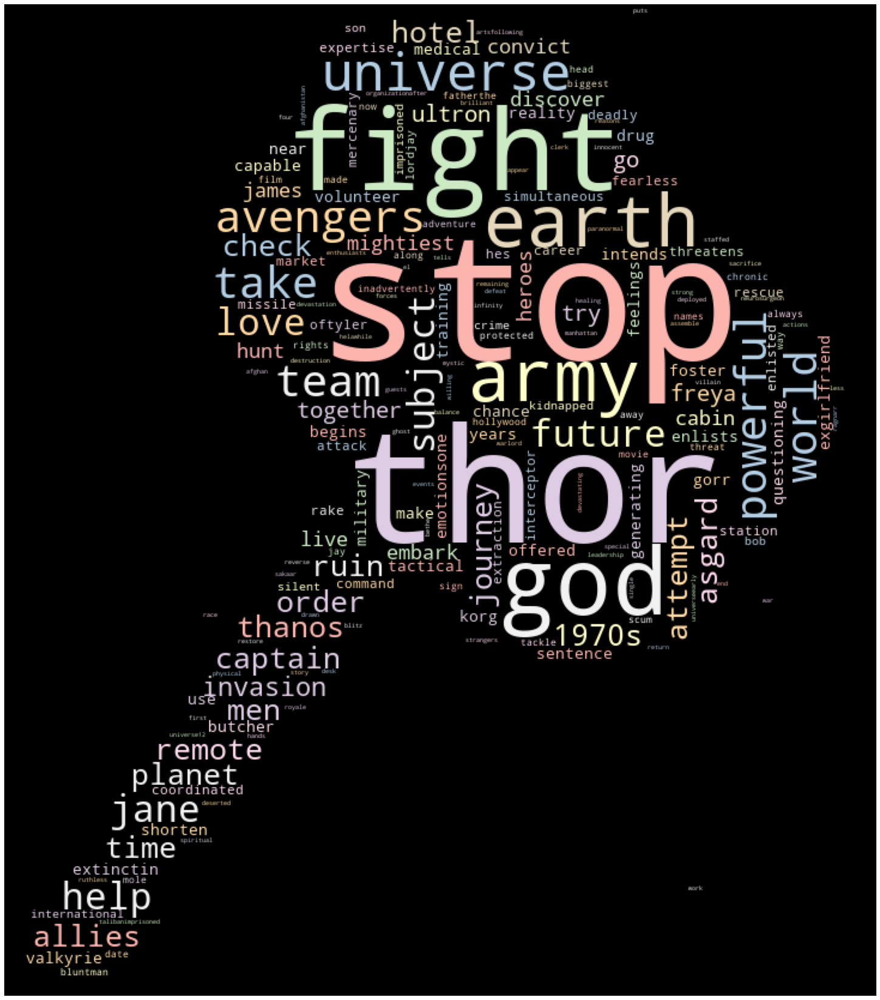

In [51]:
ChrisHemsworth_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask=mask,
    collocations=False,
    stopwords=STOPWORDS.update(["new", "must", "one", "one", "black", "things"]),
).generate(ChrisHemsworth_desc_list_clean)

plot_cloud(ChrisHemsworth_wordcloud)

### Robert Downey Jr.

In [ ]:
RobertDowneyJr_url = 'https://www.imdb.com/name/nm0000375/'
RobertDowneyJr_soup = actor_link_soup(RobertDowneyJr_url)

RobertDowneyJr_desc_list = get_movie_descriptions_by_actor_soup(RobertDowneyJr_soup)

with open('3_RobertDowneyJr_desc.txt', 'w', encoding="utf-8") as f:
    for line in RobertDowneyJr_desc_list:
        f.write(f"{line}\n")

In [53]:
with open('3_RobertDowneyJr_desc.txt', 'r') as file:
    RobertDowneyJr_desc = file.read().replace('\n', '')

In [55]:
RobertDowneyJr_desc_list_clean = RobertDowneyJr_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [86]:
mask_link = 'https://i.pinimg.com/736x/ff/00/c5/ff00c5c45f84412116b8b34e4c0ed15f--iron-man-face-man-faces.jpg'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

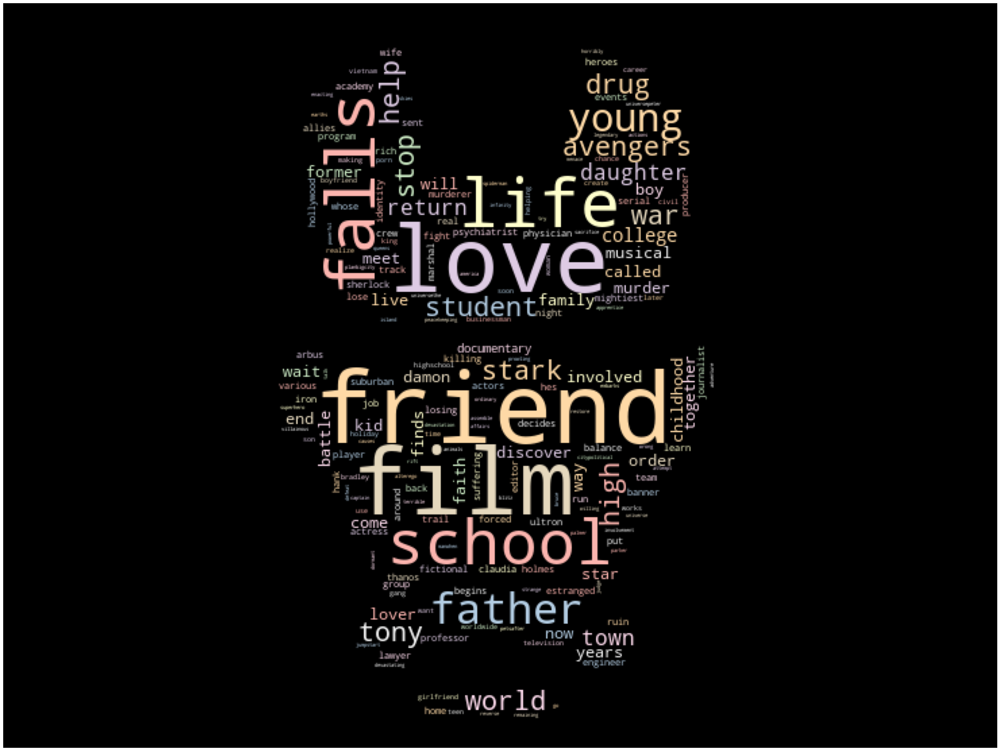

In [88]:
RobertDowneyJr_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask=mask,
    collocations=False,
    stopwords=STOPWORDS.update(
        [
            "become",
            "becomes",
            "man",
            "find",
            "finds"
            "film",
            "movie",
            "tries",
            "actor",
            "year",
            "best",
            "make",
            "two",
            "turns",
            "la",
            "last",
            "new",
            "york"
        ]
    ),
).generate(RobertDowneyJr_desc_list_clean)

plot_cloud(RobertDowneyJr_wordcloud)

### Akshay Kumar

In [ ]:
AkshayKumar_url = 'https://www.imdb.com/name/nm0474774/'
AkshayKumar_soup = actor_link_soup(AkshayKumar_url)

AkshayKumar_desc_list = get_movie_descriptions_by_actor_soup(AkshayKumar_soup)

with open('4_AkshayKumar_desc.txt', 'w', encoding="utf-8") as f:
    for line in AkshayKumar_desc_list:
        f.write(f"{line}\n")

In [91]:
with open('4_AkshayKumar_desc.txt', 'r') as file:
    AkshayKumar_desc = file.read().replace('\n', '')

In [98]:
AkshayKumar_desc_list_clean = AkshayKumar_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [101]:
mask_link = 'https://www.drodd.com/images16/black-letters23.jpg'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

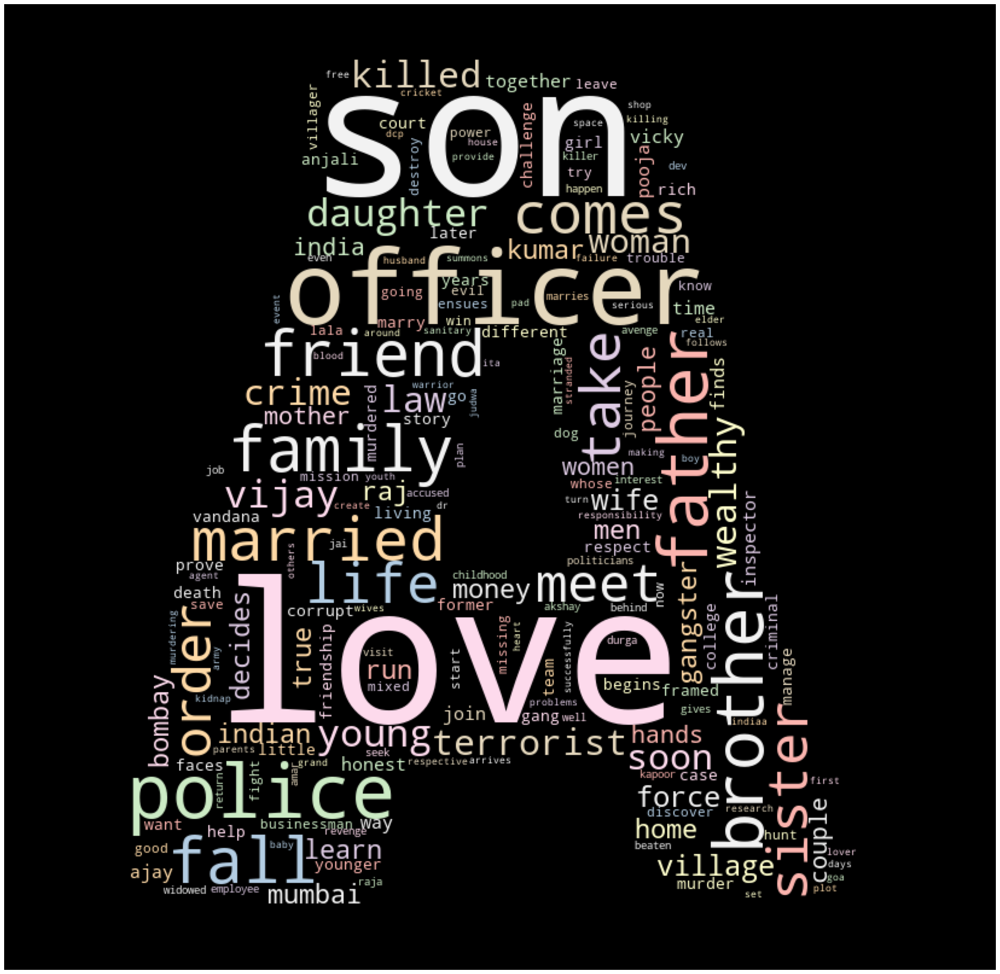

In [102]:
AkshayKumar_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask=mask,
    collocations=False,
    stopwords=STOPWORDS.update(["goes", "come", "decide", "bring", "lives", "three", "day", "attempts", "will"]),
).generate(AkshayKumar_desc_list_clean)

plot_cloud(AkshayKumar_wordcloud)

### Jackie Chan

In [ ]:
JackieChan_url = 'https://www.imdb.com/name/nm0000329/'
JackieChan_soup = actor_link_soup(JackieChan_url)

JackieChan_desc_list = get_movie_descriptions_by_actor_soup(JackieChan_soup)

with open('5_JackieChan_desc.txt', 'w', encoding="utf-8") as f:
    for line in JackieChan_desc_list:
        f.write(f"{line}\n")

In [104]:
with open('5_JackieChan_desc.txt', 'r') as file:
    JackieChan_desc = file.read().replace('\n', '')

In [106]:
JackieChan_desc_list_clean = JackieChan_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [110]:
mask_link = 'https://conceptdraw.com/a1685c3/p10/preview/640/pict---abc-vector-stencils-library'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

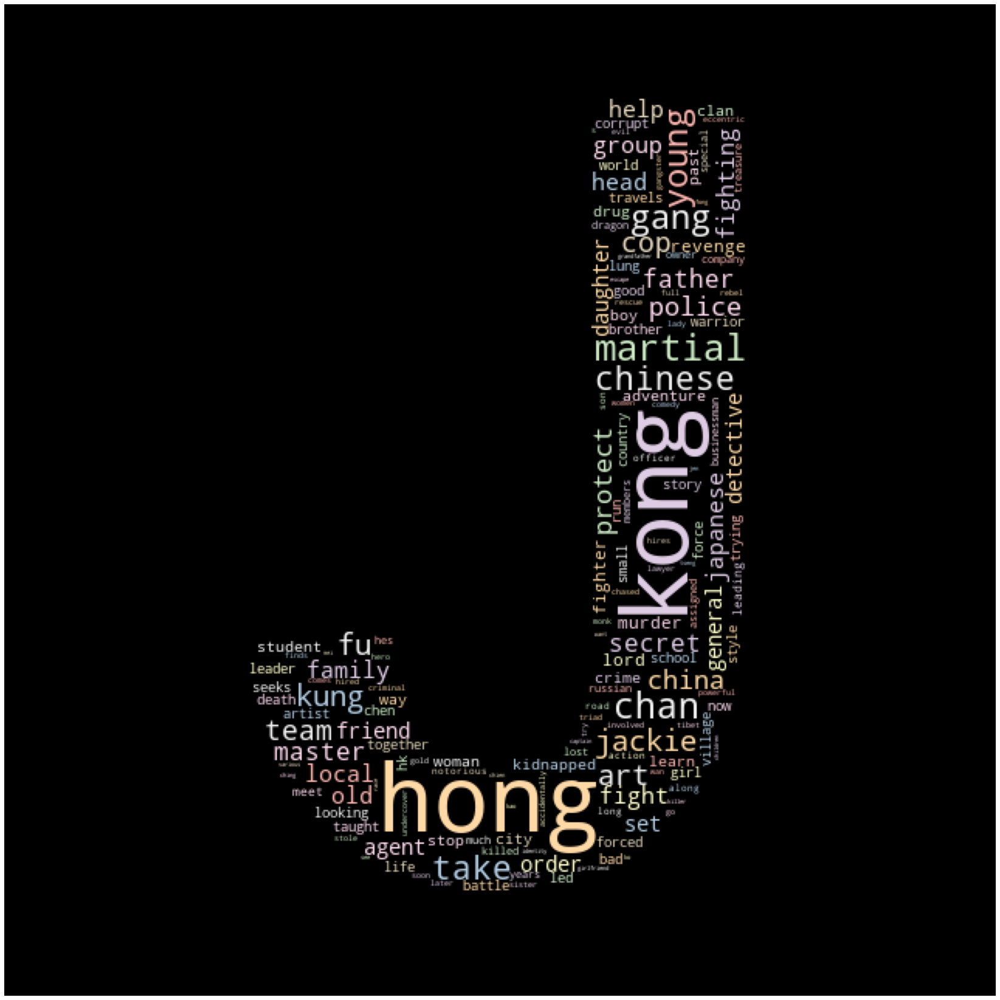

In [111]:
JackieChan_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask=mask,
    collocations=False,
    stopwords=STOPWORDS,
).generate(JackieChan_desc_list_clean)

plot_cloud(JackieChan_wordcloud)

### Bradley Cooper

In [ ]:
BradleyCooper_url = 'https://www.imdb.com/name/nm0177896/'
BradleyCooper_soup = actor_link_soup(BradleyCooper_url)

BradleyCooper_desc_list = get_movie_descriptions_by_actor_soup(BradleyCooper_soup)

with open('6_BradleyCooper_desc.txt', 'w', encoding="utf-8") as f:
    for line in BradleyCooper_desc_list:
        f.write(f"{line}\n")

In [114]:
with open('6_BradleyCooper_desc.txt', 'r') as file:
    BradleyCooper_desc = file.read().replace('\n', '')

In [118]:
BradleyCooper_desc_list_clean = BradleyCooper_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [123]:
mask_link = 'https://images.thdstatic.com/productImages/72b9aa15-5112-4dff-9639-b68170e00530/svn/house-numbers-address-letters-3582b-b-64_1000.jpg'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

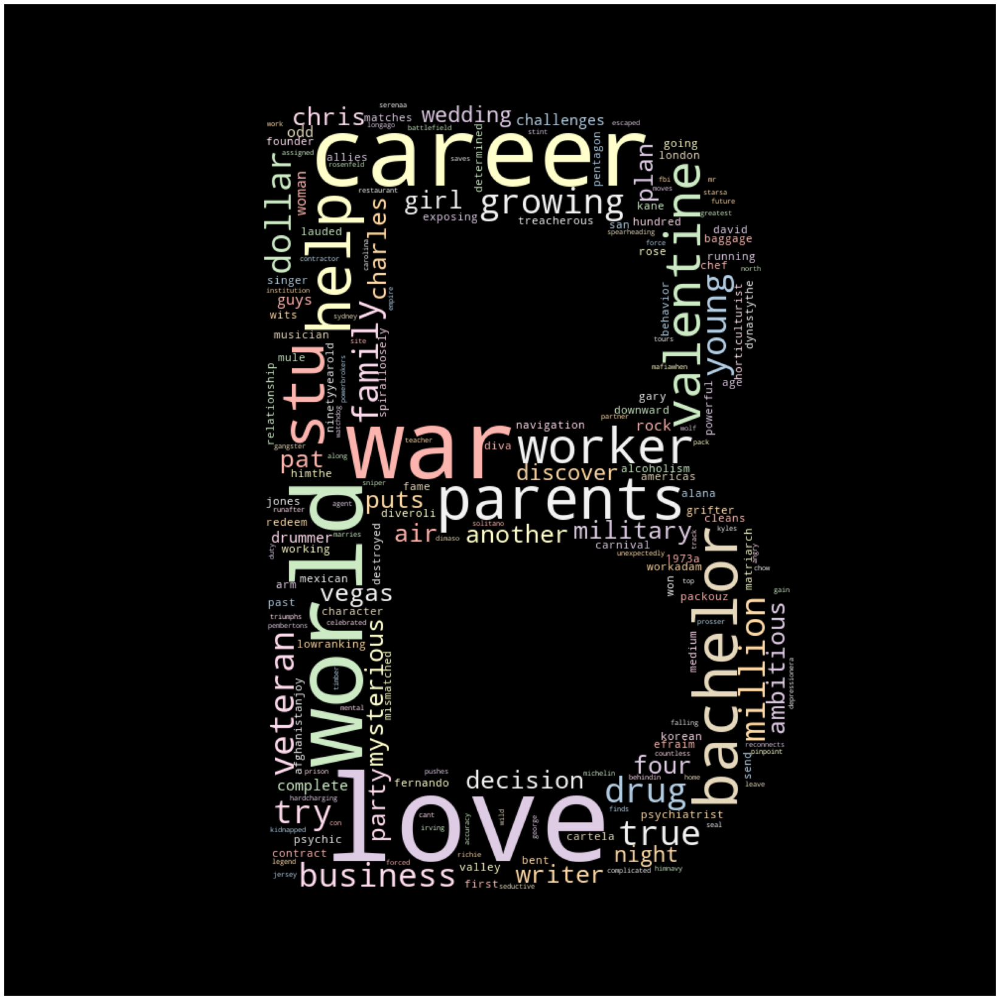

In [124]:
BradleyCooper_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask=mask,
    collocations=False,
    stopwords=STOPWORDS.update(
        [
            "way",
            "former",
            "meets",
            "group",
            "returns",
            "story",
            "save",
            "order",
            "based",
            "move",
            "men",
            "people",
            "around",
            "back",
            "los",
            "angeles",
            "las",
            "years",
            "title",
            "loaded"
        ]
    ),
).generate(BradleyCooper_desc_list_clean)

plot_cloud(BradleyCooper_wordcloud)

In [ ]:
AdamSandler_url = 'https://www.imdb.com/name/nm0001191/'
AdamSandler_soup = actor_link_soup(AdamSandler_url)

AdamSandler_desc_list = get_movie_descriptions_by_actor_soup(AdamSandler_soup)

with open('7_AdamSandler_desc.txt', 'w', encoding="utf-8") as f:
    for line in AdamSandler_desc_list:
        f.write(f"{line}\n")

In [126]:
with open('7_AdamSandler_desc.txt', 'r') as file:
    AdamSandler_desc = file.read().replace('\n', '')

In [128]:
AdamSandler_desc_list_clean = AdamSandler_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [129]:
mask_link = 'https://www.drodd.com/images16/black-letters23.jpg'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

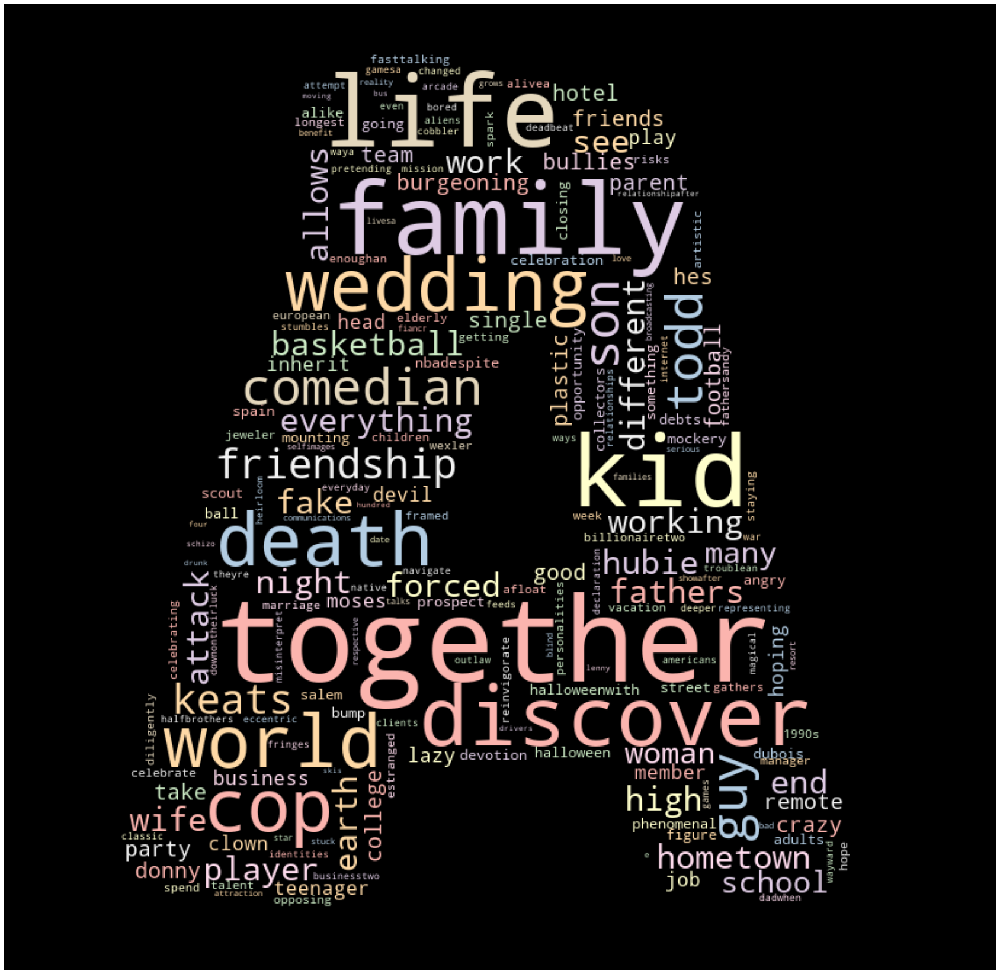

In [130]:
AdamSandler_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask=mask,
    collocations=False,
    stopwords=STOPWORDS.update(
        [
            "upon",
            "run",
            "event",
            "old",
            "city",
            "york",
            "go",
            "help",
            "soon",
            "finds",
            "media",
            "show",
            "refuses",
            "raised", 
            "form",
            "big",
            "five",
            "start", 
            "television"
        ]
    ),
).generate(AdamSandler_desc_list_clean)
# Plot
plot_cloud(AdamSandler_wordcloud)

In [ ]:
ScarlettJohansson_url = 'https://www.imdb.com/name/nm0424060/'
ScarlettJohansson_soup = actor_link_soup(ScarlettJohansson_url)

ScarlettJohansson_desc_list = get_movie_descriptions_by_actor_soup(ScarlettJohansson_soup)

with open('8_ScarlettJohansson_desc.txt', 'w', encoding="utf-8") as f:
    for line in ScarlettJohansson_desc_list:
        f.write(f"{line}\n")

In [132]:
with open('8_ScarlettJohansson_desc.txt', 'r') as file:
    ScarlettJohansson_desc = file.read().replace('\n', '')

In [134]:
ScarlettJohansson_desc_list_clean = ScarlettJohansson_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [139]:
mask_link = 'https://www.centurioneurope.co.uk/media/catalog/product/cache/1/image/800x800/9df78eab33525d08d6e5fb8d27136e95/4/7/47abce59-9724-49b9-9453-ad0720d12bdc_1.jpg'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

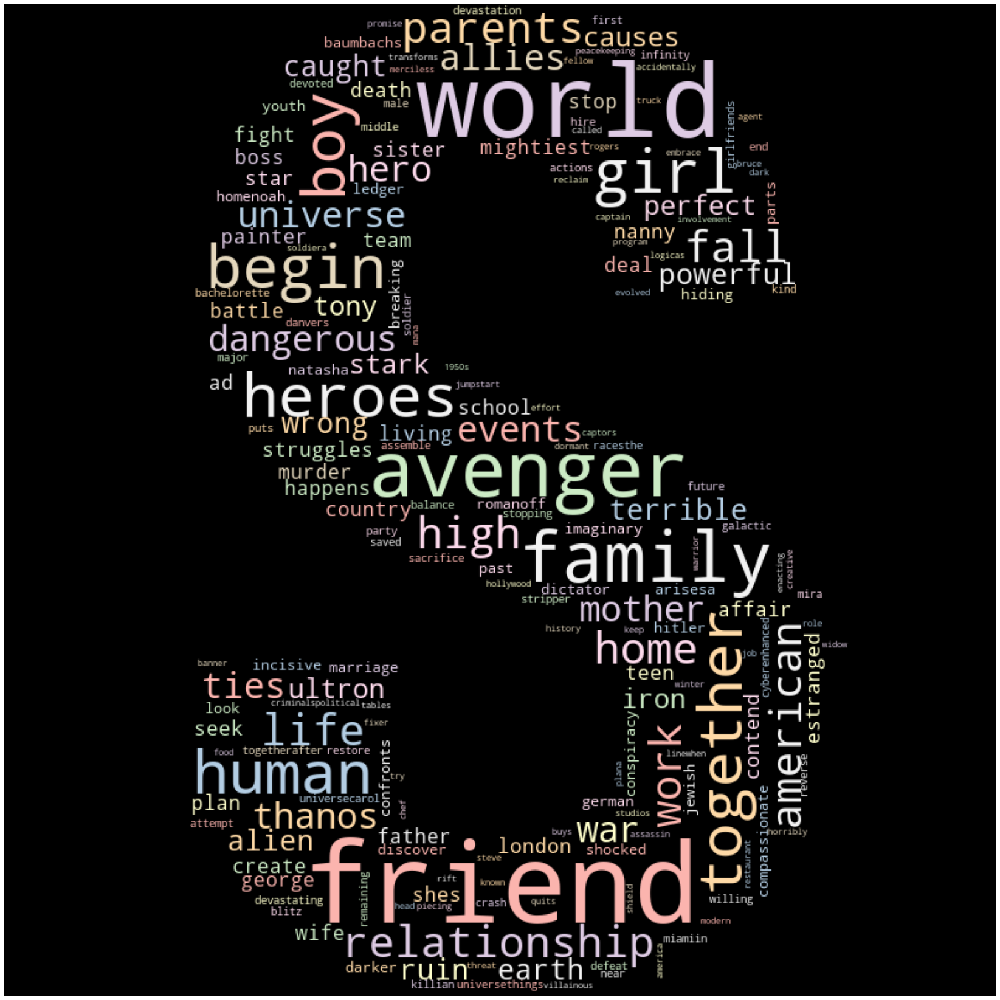

In [140]:
ScarlettJohansson_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask=mask,
    collocations=False,
    stopwords=STOPWORDS.update(["young", "whose", "terribly", "staying", "leave", "place", "beyond", "woman"]),
).generate(ScarlettJohansson_desc_list_clean)

plot_cloud(ScarlettJohansson_wordcloud)

In [ ]:
SofiaVergara_url = 'https://www.imdb.com/name/nm0005527/'
SofiaVergara_soup = actor_link_soup(SofiaVergara_url)

SofiaVergara_desc_list = get_movie_descriptions_by_actor_soup(SofiaVergara_soup)

with open('9_SofiaVergara_desc.txt', 'w', encoding="utf-8") as f:
    for line in SofiaVergara_desc_list:
        f.write(f"{line}\n")

In [143]:
with open('9_SofiaVergara_desc.txt', 'r') as file:
    SofiaVergara_desc = file.read().replace('\n', '')

In [144]:
SofiaVergara_desc_list_clean = SofiaVergara_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [145]:
mask_link = 'https://www.centurioneurope.co.uk/media/catalog/product/cache/1/image/800x800/9df78eab33525d08d6e5fb8d27136e95/4/7/47abce59-9724-49b9-9453-ad0720d12bdc_1.jpg'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

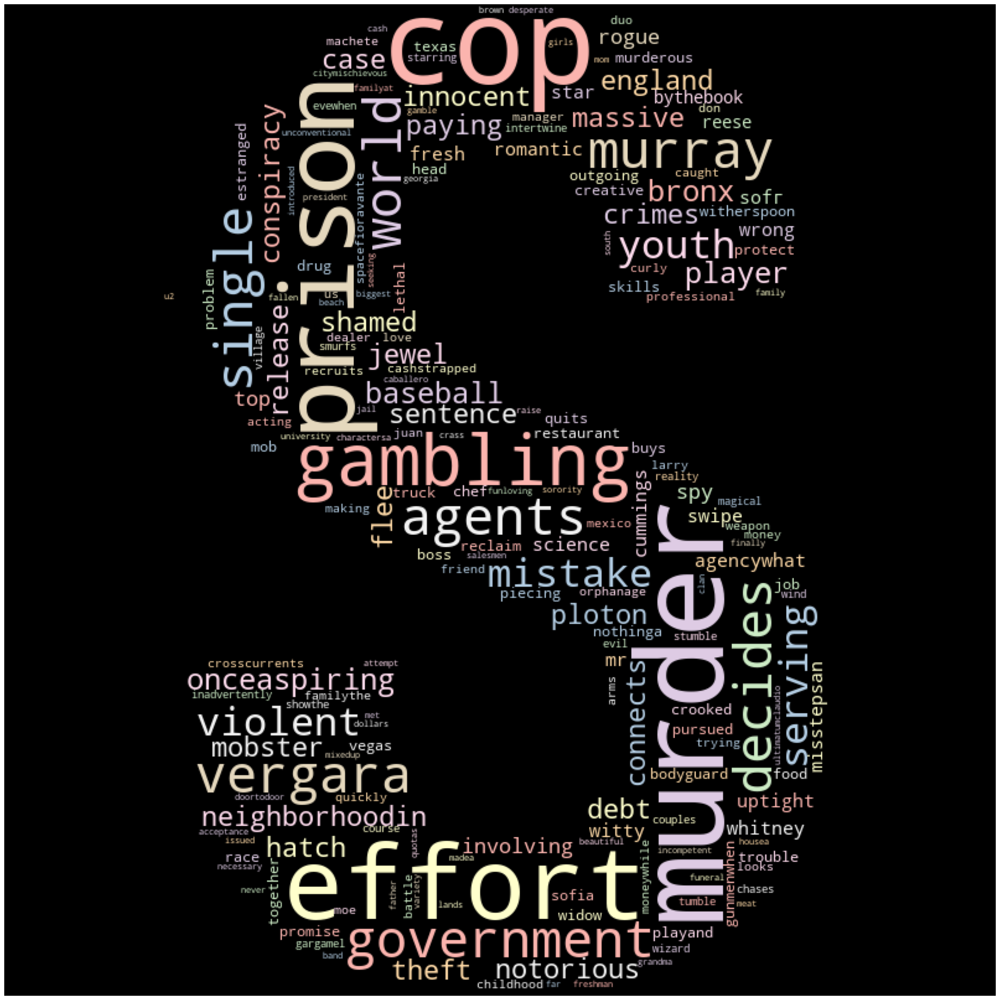

In [146]:
SofiaVergara_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask=mask,
    collocations=False,
    stopwords=STOPWORDS.update(
        [
            "couple",
            "take",
            "takes",
            "makes",
            "plot",
            "playing",
            "nothing",
            "made",
            "right",
            "avoid",
            "several",
            "look",
            "tiny",
            "blue",
            "behind",
            "launch"
        ]
    ),
).generate(SofiaVergara_desc_list_clean)

plot_cloud(SofiaVergara_wordcloud)

In [ ]:
ChrisEvans_url = 'https://www.imdb.com/name/nm0262635/'
ChrisEvans_soup = actor_link_soup(ChrisEvans_url)

ChrisEvans_desc_list = get_movie_descriptions_by_actor_soup(ChrisEvans_soup)

with open('10_ChrisEvans_desc.txt', 'w', encoding="utf-8") as f:
    for line in ChrisEvans_desc_list:
        f.write(f"{line}\n")

In [149]:
with open('10_ChrisEvans_desc.txt', 'r') as file:
    ChrisEvans_desc = file.read().replace('\n', '')

In [152]:
ChrisEvans_desc_list_clean = ChrisEvans_desc.lower().translate(str.maketrans('', '', string.punctuation))

In [153]:
mask_link = 'https://cdn.pngsumo.com/captain-america-logo-decal-captain-america-logo-black-and-white-1000_1000.jpg'
mask = np.array(Image.open(requests.get(mask_link, stream=True).raw))

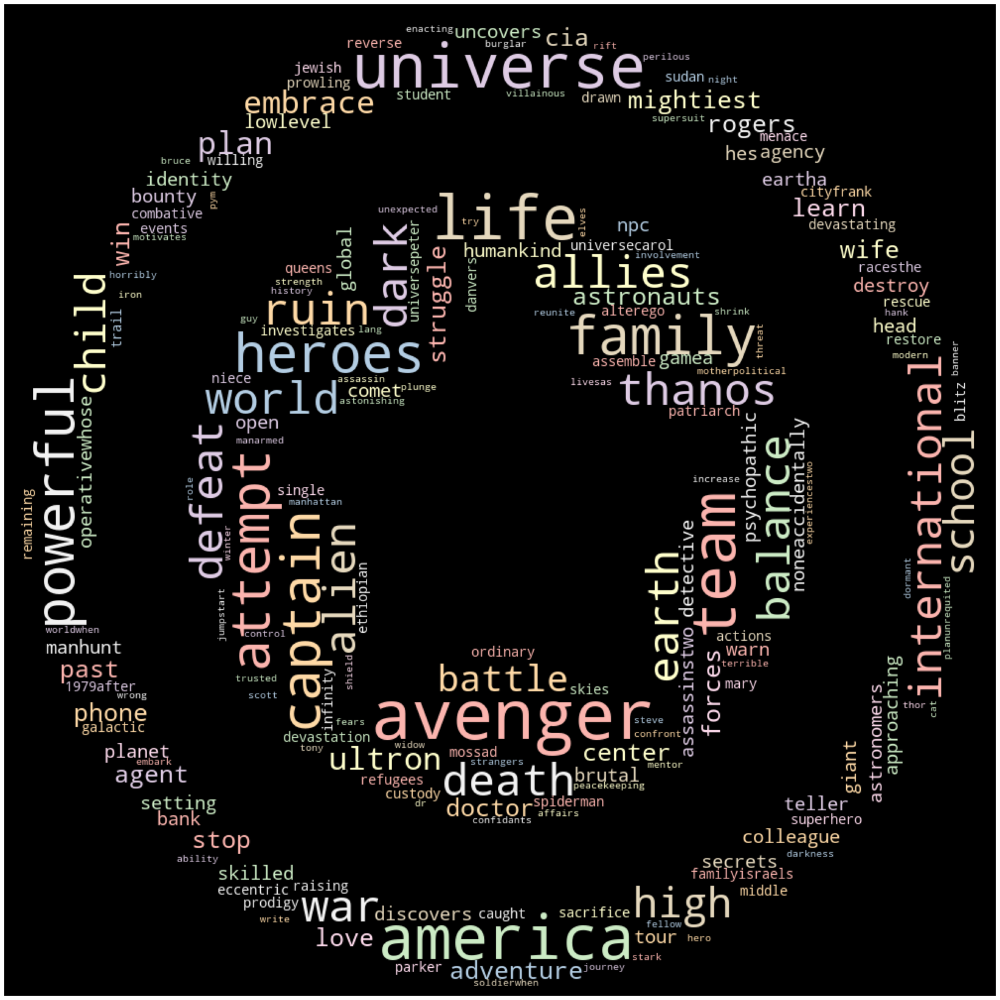

In [154]:
ChrisEvans_wordcloud = WordCloud(
    width=3000,
    height=2000,
    random_state=1,
    background_color="black",
    colormap="Pastel1",
    mask=mask,
    collocations=False,
    stopwords=STOPWORDS.update(
        [
            "true",
            "puts",
            "known",
            "called",
            "personal",
            "program",
            "stuck",
            "causes",
            "pull",
            "puts",
            "grow",
            "inner",
            "others",
            "scale",
            "special",
            "end",
            "actually",
            "evening",
            "inside"
        ]
    ),
).generate(ChrisEvans_desc_list_clean)

plot_cloud(ChrisEvans_wordcloud)